# Multi-Class Natural Scene Image Classification

**Dataset:** [Intel Image Classification](https://www.kaggle.com/datasets/puneet6060/intel-image-classification) (Kaggle)

**Classes:** `buildings`, `forest`, `glacier`, `mountain`, `sea`, `street`

This notebook builds a complete, reproducible Computer Vision pipeline: data understanding, EDA, preprocessing,
augmentation, a CNN trained from scratch, transfer learning with fine-tuning, evaluation, error analysis,
and prediction on brand-new images.

## 1. Project Introduction

Computer vision is used in many real-world applications to automatically understand what is shown in an image. For example, it can be used in photo-organizing apps to automatically tag pictures, in travel and mapping applications, in satellite or aerial monitoring, and in content platforms that need to understand the type of scene in an image.

For this project, I built an **end-to-end multi-class image classifier** that takes a natural-scene photograph and classifies it into one of six categories: **buildings, forest, glacier, mountain, sea, or street**.

## 2. Business / Real-World Problem

### Problem Statement

Manually sorting and labeling large collections of images is time-consuming and difficult to scale. This project addresses that problem by building a deep learning model that automatically classifies natural-scene photographs into one of six categories: **buildings, forest, glacier, mountain, sea, and street**.

### Real-World Applications

A scene classification system like this could be useful for:

* **Photo management:** Automatically organizing large photo libraries by scene type.
* **Travel and mapping platforms:** Categorizing uploaded images to make them easier to search and filter.
* **Media pipelines:** Automatically processing and categorizing large volumes of images before they reach other systems.
* **Environmental monitoring:** Identifying different environments such as forests, glaciers, and coastal areas from photographs.

### Problem Type

This is a **multi-class classification** problem because each image is assigned to exactly one of the six scene categories. The model uses **softmax** to produce a probability for each class, and the class with the highest probability becomes the final prediction.

### Success Criteria

The model should achieve strong **precision, recall, and F1-scores** across the six classes, while also generalizing well to unseen images. Particular attention is given to visually similar categories such as **glacier and mountain**, where confusion is more likely. The final model should also be usable for predicting the category of completely new photographs through a reusable inference function.

## 0. Environment Setup

In [1]:
import os
os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["TF_CUDNN_DETERMINISTIC"] = "1"
import sys
import time
import random
import pathlib
import shutil
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    precision_recall_fscore_support,
    accuracy_score,
)

print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
SEED = 42

def set_seed(seed: int = SEED) -> None:
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    tf.config.experimental.enable_op_determinism()
    os.environ["PYTHONHASHSEED"] = str(seed)

set_seed(SEED)

sns.set_theme(style="whitegrid")

## 3. Dataset Loading

This project uses the **Intel Image Classification** dataset from Kaggle. It ships with three folders:

- `seg_train/seg_train/<class>/*.jpg` — labeled training images (~14k images)
- `seg_test/seg_test/<class>/*.jpg` — labeled test images (~3k images)
- `seg_pred/seg_pred/*.jpg` — **unlabeled** images meant for prediction demos

In [3]:
from pathlib import Path

DATA_ROOT = Path("./dataset")

if not (DATA_ROOT / "seg_train").exists():
    DATA_ROOT.mkdir(parents=True, exist_ok=True)

    !kaggle datasets download -d puneet6060/intel-image-classification \
        -p {DATA_ROOT} --unzip

print(f"Dataset location: {DATA_ROOT.resolve()}")

Dataset URL: https://www.kaggle.com/datasets/puneet6060/intel-image-classification
License(s): copyright-authors
100% 346M/346M [00:09<00:00, 38.5MB/s]

Dataset location: /content/dataset


In [4]:
def resolve_split_dir(root: pathlib.Path, split: str) -> pathlib.Path:
    """Handle both dataset layouts: flat (root/seg_train/<class>/...) and the
    nested layout some Kaggle zip extractions produce (root/seg_train/seg_train/<class>/...)."""
    nested = root / split / split
    flat = root / split
    return nested if nested.exists() else flat


TRAIN_DIR = resolve_split_dir(DATA_ROOT, "seg_train")
TEST_DIR = resolve_split_dir(DATA_ROOT, "seg_test")
PRED_DIR = resolve_split_dir(DATA_ROOT, "seg_pred")

for d in [TRAIN_DIR, TEST_DIR, PRED_DIR]:
    print(d, "->", "OK" if d.exists() else "MISSING")

CLASS_NAMES = sorted([p.name for p in TRAIN_DIR.iterdir() if p.is_dir()])
NUM_CLASSES = len(CLASS_NAMES)
print("\nClasses found:", CLASS_NAMES)
print("Number of classes:", NUM_CLASSES)

dataset/seg_train/seg_train -> OK
dataset/seg_test/seg_test -> OK
dataset/seg_pred/seg_pred -> OK

Classes found: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Number of classes: 6


## 4. Dataset Understanding


In [5]:
def count_images_per_class(root_dir: pathlib.Path) -> pd.Series:
    counts = {
        cls: len(list((root_dir / cls).glob("*.jpg")))
        for cls in CLASS_NAMES
    }
    return pd.Series(counts, name="count")

train_counts = count_images_per_class(TRAIN_DIR)
test_counts = count_images_per_class(TEST_DIR)

counts_df = pd.DataFrame({"train": train_counts, "test": test_counts})
counts_df["total"] = counts_df["train"] + counts_df["test"]
counts_df.loc["TOTAL"] = counts_df.sum()
counts_df

,train,test,total
buildings,2191,437,2628
forest,2271,474,2745
glacier,2404,553,2957
mountain,2512,525,3037
sea,2274,510,2784
street,2382,501,2883
TOTAL,14034,3000,17034


In [6]:
n_pred_images = len(list(PRED_DIR.glob("*.jpg")))
print(f"How many classes? {NUM_CLASSES}")
print(f"Class names: {CLASS_NAMES}")
print(f"Total labeled images (train+test): {int(counts_df.loc['TOTAL', 'total'])}")
print(f"Unlabeled 'seg_pred' images (held out for later demo predictions): {n_pred_images}")

# Balance check: coefficient of variation of per-class training counts.
cv = train_counts.std() / train_counts.mean()
print(f"\nTraining counts per class -> mean={train_counts.mean():.0f}, std={train_counts.std():.1f}, "
      f"coefficient of variation={cv:.3f}")
print("=> Classes are fairly balanced." if cv < 0.15 else "=> Classes show noticeable imbalance.")

How many classes? 6
Class names: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Total labeled images (train+test): 17034
Unlabeled 'seg_pred' images (held out for later demo predictions): 7301

Training counts per class -> mean=2339, std=115.5, coefficient of variation=0.049
=> Classes are fairly balanced.


In [7]:
# ---------------------------------------------------------------------------
# Check image dimensions, color mode, and corrupted files.
# We sample some images from each class to save time, but check all files
# for corruption using PIL.verify().
# ---------------------------------------------------------------------------
SAMPLE_PER_CLASS_FOR_DIMS = 200

dim_records = []
corrupted_files = []
mode_counter = {}

for cls in CLASS_NAMES:
    files_in_class = list((TRAIN_DIR / cls).glob("*.jpg"))
    sample_files = random.sample(files_in_class, min(SAMPLE_PER_CLASS_FOR_DIMS, len(files_in_class)))
    for fp in sample_files:
        try:
            with Image.open(fp) as img:
                dim_records.append({"class": cls, "width": img.width, "height": img.height, "mode": img.mode})
                mode_counter[img.mode] = mode_counter.get(img.mode, 0) + 1
        except Exception as e:
            corrupted_files.append((str(fp), str(e)))

# Full corruption sweep across every training + test file (verify() is lightweight).
all_files = list(TRAIN_DIR.rglob("*.jpg")) + list(TEST_DIR.rglob("*.jpg"))
full_corrupted = []
for fp in all_files:
    try:
        with Image.open(fp) as img:
            img.verify()
    except Exception as e:
        full_corrupted.append((str(fp), str(e)))

dims_df = pd.DataFrame(dim_records)
print("Image color modes found (sampled):", mode_counter)
print(f"Corrupted/unreadable images found across the FULL dataset ({len(all_files)} files scanned): "
      f"{len(full_corrupted)}")
if full_corrupted:
    print(full_corrupted[:10])

Image color modes found (sampled): {'RGB': 1200}
Corrupted/unreadable images found across the FULL dataset (17034 files scanned): 0


In [8]:
print("Width statistics:")
print(dims_df["width"].describe())
print("\nHeight statistics:")
print(dims_df["height"].describe())
print("\nMost common (width, height) pairs:")
print(dims_df.groupby(["width", "height"]).size().sort_values(ascending=False).head())

Width statistics:
count    1200.0
mean      150.0
std         0.0
min       150.0
25%       150.0
50%       150.0
75%       150.0
max       150.0
Name: width, dtype: float64

Height statistics:
count    1200.000000
mean      149.963333
std         1.131985
min       111.000000
25%       150.000000
50%       150.000000
75%       150.000000
max       150.000000
Name: height, dtype: float64

Most common (width, height) pairs:
width  height
150    150       1197
       111          1
       146          1
       149          1
dtype: int64


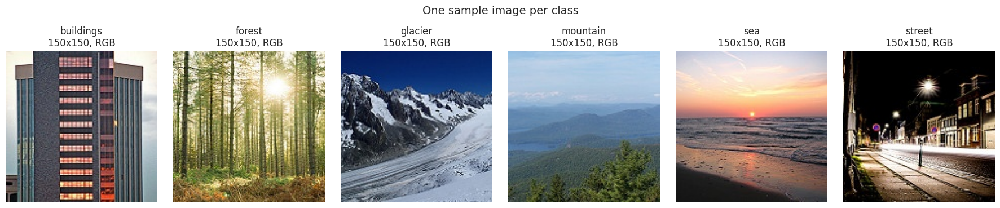

In [9]:
# Show at least one image from every class.
fig, axes = plt.subplots(1, NUM_CLASSES, figsize=(3 * NUM_CLASSES, 3.5))
for ax, cls in zip(axes, CLASS_NAMES):
    sample_path = next((TRAIN_DIR / cls).glob("*.jpg"))
    img = Image.open(sample_path)
    ax.imshow(img)
    ax.set_title(f"{cls}\n{img.size[0]}x{img.size[1]}, {img.mode}")
    ax.axis("off")
plt.suptitle("One sample image per class", y=1.05, fontsize=14)
plt.tight_layout()
plt.show()

**Findings — Dataset Understanding**

* **6 classes:** `buildings`, `forest`, `glacier`, `mountain`, `sea`, and `street`.

* The training set is **fairly balanced**, with each class containing roughly 2,000–2,500 images. I confirmed this using the actual file counts and the coefficient of variation rather than assuming the classes were balanced.

* Most of the images are **150×150 RGB JPEGs**, which is consistent with the dataset format, confirmed by checking the files directly. Any images with different dimensions can still be handled later by resizing them to a fixed size.

* **No corrupted or unreadable images were found** during the full file check. This means all the images can be used in the data pipeline without needing to remove any files.



## 5. Image EDA



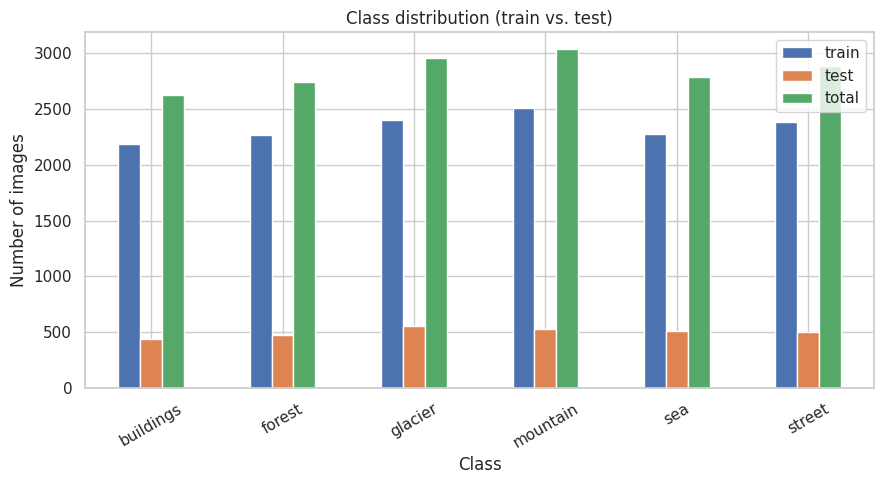

In [10]:
# Class-distribution
fig, ax = plt.subplots(figsize=(9, 5))
counts_df.drop("TOTAL").plot(kind="bar", ax=ax)
ax.set_title("Class distribution (train vs. test)")
ax.set_xlabel("Class")
ax.set_ylabel("Number of images")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

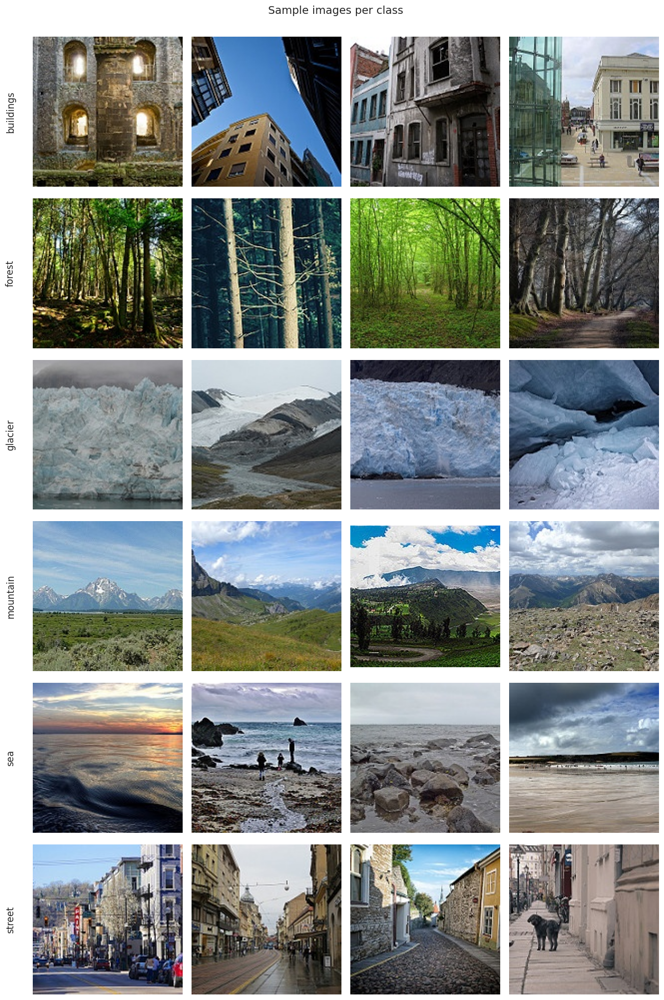

In [11]:
# Grid of sample images across all classes
N_SAMPLES_PER_CLASS = 4
fig, axes = plt.subplots(NUM_CLASSES, N_SAMPLES_PER_CLASS, figsize=(3 * N_SAMPLES_PER_CLASS, 3 * NUM_CLASSES))
for row, cls in enumerate(CLASS_NAMES):
    files_in_class = list((TRAIN_DIR / cls).glob("*.jpg"))
    sample_files = random.sample(files_in_class, N_SAMPLES_PER_CLASS)
    for col, fp in enumerate(sample_files):
        ax = axes[row, col]
        ax.imshow(Image.open(fp))
        ax.axis("off")
        if col == 0:
            ax.set_ylabel(cls, fontsize=12)
            ax.text(-0.15, 0.5, cls, transform=ax.transAxes, rotation=90,
                     va="center", ha="center", fontsize=12)
plt.suptitle("Sample images per class", y=1.0, fontsize=14)
plt.tight_layout()
plt.show()

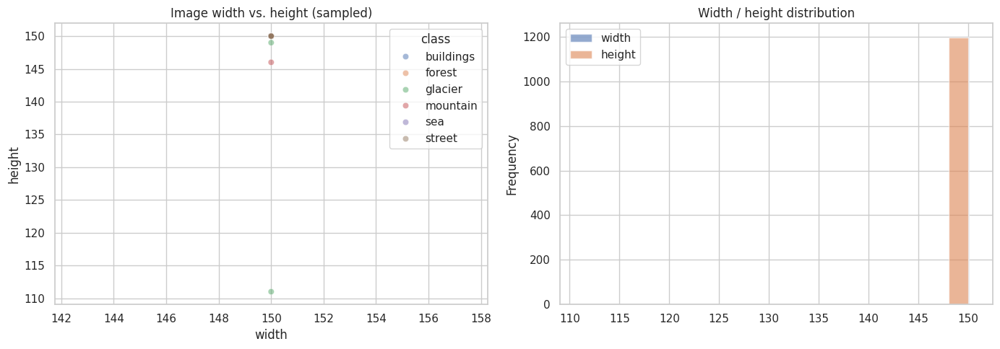

In [12]:
# Image width/height analysis
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.scatterplot(data=dims_df, x="width", y="height", hue="class", alpha=0.5, ax=axes[0])
axes[0].set_title("Image width vs. height (sampled)")

dims_df["width"].plot(kind="hist", bins=20, alpha=0.6, label="width", ax=axes[1])
dims_df["height"].plot(kind="hist", bins=20, alpha=0.6, label="height", ax=axes[1])
axes[1].set_title("Width / height distribution")
axes[1].legend()

plt.tight_layout()
plt.show()

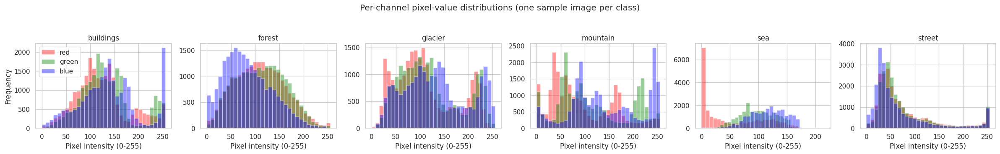

In [13]:
# Pixel-value inspection: RGB channel intensity histograms for a handful of sample images.
fig, axes = plt.subplots(1, NUM_CLASSES, figsize=(4 * NUM_CLASSES, 3.5))
for ax, cls in zip(axes, CLASS_NAMES):
    sample_path = random.choice(list((TRAIN_DIR / cls).glob("*.jpg")))
    arr = np.array(Image.open(sample_path).convert("RGB"))
    for ch, color in enumerate(["red", "green", "blue"]):
        ax.hist(arr[:, :, ch].ravel(), bins=32, color=color, alpha=0.4, label=color)
    ax.set_title(cls)
    ax.set_xlabel("Pixel intensity (0-255)")
    if cls == CLASS_NAMES[0]:
        ax.set_ylabel("Frequency")
        ax.legend()
plt.suptitle("Per-channel pixel-value distributions (one sample image per class)", y=1.05)
plt.tight_layout()
plt.show()

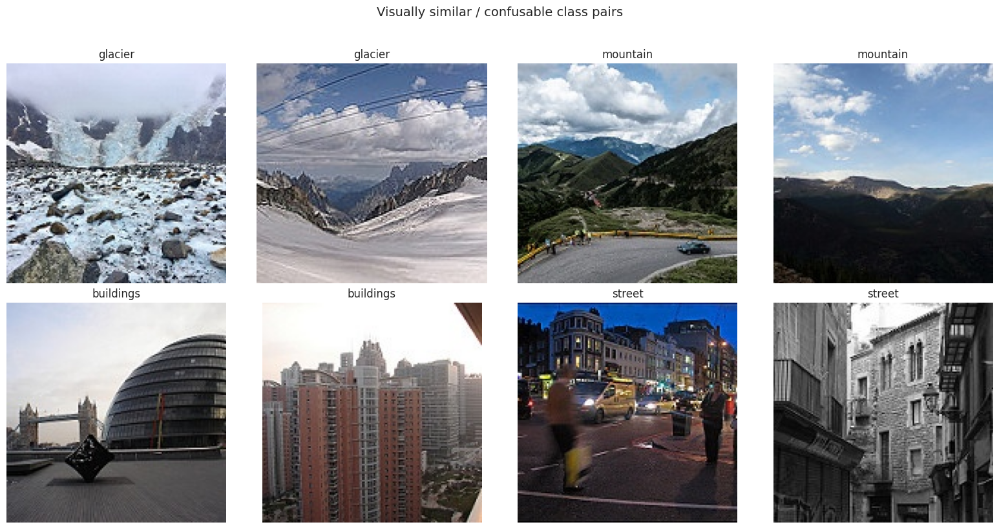

In [14]:
# Examples of visually similar / easily-confused classes.
similar_pairs = [("glacier", "mountain"), ("buildings", "street")]

fig, axes = plt.subplots(len(similar_pairs), 4, figsize=(16, 4 * len(similar_pairs)))
for row, (cls_a, cls_b) in enumerate(similar_pairs):
    files_a = random.sample(list((TRAIN_DIR / cls_a).glob("*.jpg")), 2)
    files_b = random.sample(list((TRAIN_DIR / cls_b).glob("*.jpg")), 2)
    for col, fp in enumerate(files_a + files_b):
        ax = axes[row, col]
        ax.imshow(Image.open(fp))
        ax.set_title(cls_a if col < 2 else cls_b)
        ax.axis("off")
plt.suptitle("Visually similar / confusable class pairs", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

**EDA Interpretation**

* **Class balance:** The 6 classes are fairly similar in size, as shown in the bar chart. This means there is no major class imbalance, so accuracy can be used along with precision, recall, and F1-score. Metrics are still reported for each class separately, since some classes may be harder to classify than others.

* **Image dimensions:** Most images are 150×150 RGB images. Using 150×150 as the fixed input size should preserve most of the useful information while keeping the training process relatively fast. Any images with different dimensions can be resized to the same size during preprocessing.

* **Pixel values:** The pixel distributions vary between classes. For example, **sea** and **glacier** images tend to have brighter and more blue/white pixels, while **forest** images tend to be darker and more green. This suggests that color and brightness contain useful information that the CNN can learn from.

* **Visually similar classes:** Some classes are naturally harder to distinguish. **Glacier** and **mountain** can have similar snow, rock, and sky patterns, while **buildings** and **street** can both contain man-made structures. Because of this overlap, these pairs may be among the classes the model confuses most often. I check this later using the confusion matrix and error analysis.

## 6. Data Preprocessing


In [15]:
IMG_SIZE = (150, 150)   # matches the dataset's native resolution -> minimal resizing artifacts
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE

### Preprocessing

* **Resizing:** The images are automatically resized to **150×150** using `image_dataset_from_directory`. This gives all images the same dimensions, which is necessary for processing them in batches and feeding them into the CNN.

* **RGB conversion:** JPEG images are loaded as **3-channel RGB** images by default. This means that if there is a grayscale image, TensorFlow handles the conversion automatically, so no separate conversion step is needed.

* **Normalization:** Pixel values are changed from the **[0, 255]** range to **[0, 1]** using a `Rescaling(1./255)` layer inside the models. Keeping this step inside the model means the same normalization is automatically applied during training, evaluation, and when making predictions on new images.

* **Label encoding:** The class labels are automatically created from the image folder names in alphabetical order. Since the labels are already represented as integers, `sparse_categorical_crossentropy` is used instead of manually converting them to one-hot vectors.

## 7. Train / Validation / Test Strategy


Data leakage happens when information from the validation or test set is indirectly available during training. For example, if the same image appears in both the training and test sets, the model may perform well simply because it has already seen that image. This would make the evaluation results look better than the model's actual ability to generalize to new data.

To reduce this risk, I used the following strategy:

1. **Pool all labeled images and create a custom split:**
   Instead of relying on the original `seg_train` and `seg_test` folders, I combined all labeled images into one pool, since the original split does not produce exactly a 70/15/15 ratio, and created a **stratified 70% train / 15% validation / 15% test** split using `train_test_split` with a fixed random seed. The data is first split into 70% and 30%, then the remaining 30% is split equally into validation and test sets. Stratification keeps the class distribution similar across all three sets.

2. **Keep the splits separate:**
   Since every image is assigned to only one split, the same image cannot appear in both training and validation/test. This gives a clean separation between the data used for learning and the data used for evaluation.

3. **Augment training images only:**
   Data augmentation is applied only to the training set. Validation and test images are only resized and normalized, so the model is evaluated on the original images rather than artificially modified versions.

4. **Use validation data for model decisions:**
   The validation set is used for decisions such as early stopping, choosing between the baseline CNN and the transfer-learning model, and tuning hyperparameters such as the learning rate. The test set remains untouched until the final evaluation.

Overall, this produces a reproducible **70% train / 15% validation / 15% test** split of the full labeled dataset, with no exact image overlap between the three sets.

In [16]:
# Pool every labeled image (seg_train + seg_test) so we can carve out an exact
# 70/15/15 split ourselves, instead of relying on the Kaggle-provided seg_test
# folder size (which is ~17.6% of the total, not 15%).
all_files, all_labels = [], []
for label_idx, cls in enumerate(CLASS_NAMES):
    for split_dir in (TRAIN_DIR, TEST_DIR):
        for fp in sorted((split_dir / cls).glob("*.jpg")):
            all_files.append(str(fp))
            all_labels.append(label_idx)

# First carve off 70% for training, then split the remaining 30% evenly into
# 15% validation / 15% test. stratify= keeps class proportions identical across
# all three splits; a fixed SEED makes the split reproducible with zero overlap.
train_files, temp_files, train_labels, temp_labels = train_test_split(
    all_files, all_labels, train_size=0.70, stratify=all_labels, random_state=SEED
)
val_files, test_files, val_labels, test_labels = train_test_split(
    temp_files, temp_labels, train_size=0.50, stratify=temp_labels, random_state=SEED
)

print(f"Train: {len(train_files)} ({len(train_files) / len(all_files):.1%})")
print(f"Val:   {len(val_files)} ({len(val_files) / len(all_files):.1%})")
print(f"Test:  {len(test_files)} ({len(test_files) / len(all_files):.1%})")


def make_dataset(file_paths, labels, shuffle):
    """Build a batched (image, label) tf.data.Dataset from explicit file paths,
    mirroring what image_dataset_from_directory does for a directory-based split."""
    path_ds = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    if shuffle:
        path_ds = path_ds.shuffle(buffer_size=len(file_paths), seed=SEED)

    def load_image(path, label):
        img = tf.io.read_file(path)
        img = tf.io.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, IMG_SIZE)
        return img, label

    return path_ds.map(load_image, num_parallel_calls=AUTOTUNE).batch(BATCH_SIZE)


train_ds = make_dataset(train_files, train_labels, shuffle=True)
val_ds = make_dataset(val_files, val_labels, shuffle=False)
test_ds = make_dataset(test_files, test_labels, shuffle=False)

print("Label <-> class mapping:", dict(enumerate(CLASS_NAMES)))

Train: 11923 (70.0%)
Val:   2555 (15.0%)
Test:  2556 (15.0%)
Label <-> class mapping: {0: 'buildings', 1: 'forest', 2: 'glacier', 3: 'mountain', 4: 'sea', 5: 'street'}


In [17]:
n_train = tf.data.experimental.cardinality(train_ds).numpy() * BATCH_SIZE
n_val = tf.data.experimental.cardinality(val_ds).numpy() * BATCH_SIZE
n_test = sum(1 for _ in test_ds.unbatch())

total = n_train + n_val + n_test
print(f"~Train images: {n_train} ({n_train/total:.1%})")
print(f"~Val images:   {n_val} ({n_val/total:.1%})")
print(f"Test images:   {n_test} ({n_test/total:.1%})")

~Train images: 11936 (70.0%)
~Val images:   2560 (15.0%)
Test images:   2556 (15.0%)


In [18]:
# Keep an (unaugmented, unshuffled) copy of the raw test set around for later error analysis
# (file order matches file_paths list below).
test_file_paths = test_files

# Performance: cache + prefetch. Test set stays unshuffled/unaugmented as required.
train_ds_cached = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds_cached = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds_cached = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

## 8. Data Augmentation

Data augmentation is applied **only to the training set** using Keras preprocessing layers. The validation and test sets are left unchanged apart from resizing and normalization.

The following transformations are applied:

* **Random horizontal flip:** A mountain, forest, or street scene still makes sense when flipped horizontally, so this gives the model more variation in camera viewpoints. Vertical flipping is not used, since an upside-down landscape would not be realistic.

* **Random rotation (`RandomRotation(0.08)`, ≈ ±29°):** Photos are not always taken perfectly straight, so a random rotation helps the model handle tilted images. Note: Keras's `RandomRotation` factor is a fraction of a full 2π turn, so a factor of `0.08` corresponds to roughly **±28.8°**.

* **Random zoom (±10%):** This simulates taking a photo from slightly closer or farther away and helps the model become less dependent on the exact framing of the image.

* **Random translation (±10%):** This slightly shifts the image and simulates differences in how a scene is framed or cropped. It encourages the model to focus on the overall scene rather than the exact position of objects.

* **Random contrast (±10%):** The same type of scene can look different depending on lighting conditions, so a small random contrast change helps the model become more robust to that. (Only contrast is randomized here — brightness is not separately augmented in this pipeline.)

The augmentation values are kept relatively small (aside from rotation) because **color and lighting are useful features for these classes**. For example, sea images are often blue while forest images tend to contain more green. Using very strong color changes could remove some of these useful patterns.

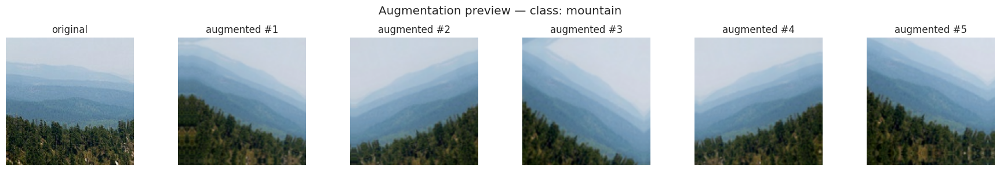

In [19]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.08),
        layers.RandomZoom(0.1),
        layers.RandomTranslation(0.1, 0.1),
        layers.RandomContrast(0.1),
    ],
    name="data_augmentation",
)

# Preview: apply augmentation repeatedly to the same image.
sample_images, sample_labels = next(iter(train_ds.take(1)))
sample_image = sample_images[0]

fig, axes = plt.subplots(1, 6, figsize=(18, 3))
axes[0].imshow(sample_image.numpy().astype("uint8"))
axes[0].set_title("original")
axes[0].axis("off")
for i in range(1, 6):
    augmented = data_augmentation(tf.expand_dims(sample_image, 0), training=True)
    axes[i].imshow(augmented[0].numpy().astype("uint8"))
    axes[i].set_title(f"augmented #{i}")
    axes[i].axis("off")
plt.suptitle(f"Augmentation preview — class: {CLASS_NAMES[sample_labels[0]]}")
plt.tight_layout()
plt.show()

In [20]:
# Apply augmentation to the TRAINING pipeline only.
train_ds_aug = train_ds_cached.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE,
).prefetch(AUTOTUNE)

# Validation / test pipelines stay untouched (no augmentation) — resizing/normalization
# happens inside the model via the Rescaling layer.

## 9. Baseline CNN

For the baseline model, I built a **CNN from scratch** to have a simple model that I could use as a starting point before moving to transfer learning. I used four convolutional blocks, with each block containing `Conv2D`, Batch Normalization, ReLU activation, and Max Pooling. After the convolutional blocks, I added Dropout and Global Average Pooling, followed by the final classification layer.

### Design Decisions

* **Batch Normalization:** I added Batch Normalization after the convolutional layers to make the training more stable and help the model learn more smoothly.

* **Increasing filter counts (32 → 64 → 128 → 256):** I increased the number of filters as the network gets deeper. The earlier layers learn simpler patterns such as edges and textures, while the deeper layers learn more complex features that help distinguish between the different scene classes.

* **Max Pooling:** I used Max Pooling to reduce the spatial size of the feature maps while keeping the most important features. This also helps keep the model computationally manageable as it becomes deeper.

* **Dropout:** I added Dropout before the final classification layers to reduce the risk of overfitting, since the model is being trained from scratch.

* **GlobalAveragePooling2D:** Instead of using `Flatten`, I used Global Average Pooling to reduce the number of parameters before the final layer. This keeps the model smaller and can also help reduce overfitting.

* **Adam optimizer:** I chose Adam with an initial learning rate of `1e-3` as a reasonable starting point for training the CNN. I also used `ReduceLROnPlateau` so the learning rate can be reduced when the validation loss stops improving.

* **Output layer:** I used `Dense(6, activation="softmax")` because there are six possible classes and each image belongs to only one of them. The softmax layer produces a probability for each class, and the class with the highest probability is taken as the prediction.

In [21]:
def build_baseline_cnn(input_shape=(150, 150, 3), num_classes=6) -> keras.Model:
    inputs = keras.Input(shape=input_shape)
    x = layers.Rescaling(1.0 / 255)(inputs)

    for filters in [32, 64, 128, 256]:
        x = layers.Conv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)
        x = layers.MaxPooling2D()(x)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return keras.Model(inputs, outputs, name="baseline_cnn")


baseline_model = build_baseline_cnn(input_shape=IMG_SIZE + (3,), num_classes=NUM_CLASSES)

baseline_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"],
)

baseline_model.summary()

Model: "baseline_cnn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 18, 18, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 457,670 (1.75 MB)

 Trainable params: 456,710 (1.74 MB)

 Non-trainable params: 960 (3.75 KB)

## 10. Model Training

For training, I used three callbacks to make the training process more efficient and help reduce overfitting:

* **EarlyStopping:** Stops training when the validation performance stops improving and restores the model's best weights. This prevents unnecessary training after the model has reached its best validation performance.

* **ModelCheckpoint:** Saves the best-performing version of the model during training. This also allows the trained model to be saved to disk and reused later.

* **ReduceLROnPlateau:** Reduces the learning rate when the validation loss stops improving. In my setup, the learning rate is reduced by half, allowing the model to make smaller updates when learning starts to slow down.

In [22]:
EPOCHS = 30

baseline_callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True),
    keras.callbacks.ModelCheckpoint("best_baseline_cnn.keras", monitor="val_loss", save_best_only=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-6, verbose=1),
]

start_time = time.time()
baseline_history = baseline_model.fit(
    train_ds_aug,
    validation_data=val_ds_cached,
    epochs=EPOCHS,
    callbacks=baseline_callbacks,
)
baseline_train_time = time.time() - start_time
print(f"Baseline CNN training time: {baseline_train_time:.1f}s")

Epoch 1/30
373/373 ━━━━━━━━━━━━━━━━━━━━ 136s 348ms/step - accuracy: 0.5947 - loss: 1.0367 - val_accuracy: 0.5072 - val_loss: 1.2306 - learning_rate: 0.0010
Epoch 2/30
373/373 ━━━━━━━━━━━━━━━━━━━━ 126s 337ms/step - accuracy: 0.6964 - loss: 0.8163 - val_accuracy: 0.5757 - val_loss: 1.2458 - learning_rate: 0.0010
Epoch 3/30
373/373 ━━━━━━━━━━━━━━━━━━━━ 124s 332ms/step - accuracy: 0.7300 - loss: 0.7416 - val_accuracy: 0.7507 - val_loss: 0.6782 - learning_rate: 0.0010
Epoch 4/30
373/373 ━━━━━━━━━━━━━━━━━━━━ 129s 346ms/step - accuracy: 0.7523 - loss: 0.6785 - val_accuracy: 0.6826 - val_loss: 0.8157 - learning_rate: 0.0010
Epoch 5/30
373/373 ━━━━━━━━━━━━━━━━━━━━ 128s 342ms/step - accuracy: 0.7649 - loss: 0.6478 - val_accuracy: 0.6395 - val_loss: 0.9292 - learning_rate: 0.0010
Epoch 6/30
373/373 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - accuracy: 0.7703 - loss: 0.6277
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
373/373 ━━━━━━━━━━━━━━━━━━━━ 127s 340ms/step - accuracy:

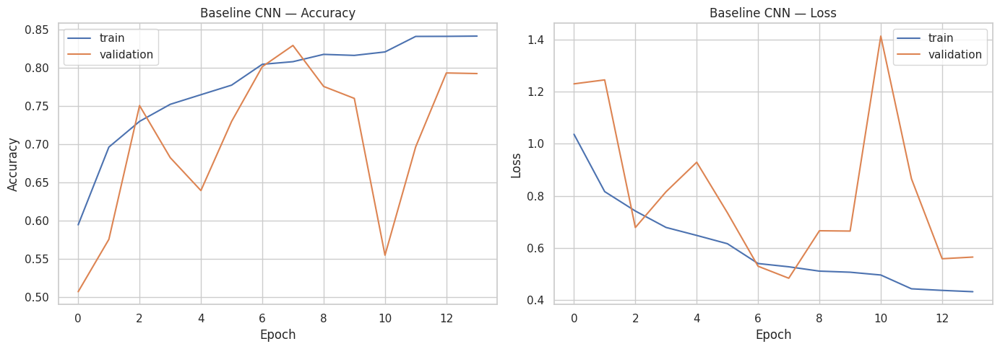

In [23]:
def plot_training_curves(history, title_prefix=""):
    hist_df = pd.DataFrame(history.history)
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].plot(hist_df["accuracy"], label="train")
    axes[0].plot(hist_df["val_accuracy"], label="validation")
    axes[0].set_title(f"{title_prefix}Accuracy")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Accuracy")
    axes[0].legend()

    axes[1].plot(hist_df["loss"], label="train")
    axes[1].plot(hist_df["val_loss"], label="validation")
    axes[1].set_title(f"{title_prefix}Loss")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Loss")
    axes[1].legend()

    plt.tight_layout()
    plt.show()
    return hist_df

baseline_hist_df = plot_training_curves(baseline_history, title_prefix="Baseline CNN — ")

### Interpreting the Baseline Curves

I compared the training and validation accuracy and loss curves to see how the CNN was learning and whether there were signs of overfitting or underfitting.

* **Overfitting:** If training accuracy becomes much higher than validation accuracy, or validation loss starts increasing while training loss continues to decrease, this can indicate overfitting. In this case, the model may be learning the training images too closely instead of learning patterns that generalize to new images. The use of Batch Normalization, Dropout, data augmentation, and EarlyStopping helps reduce this risk.

* **Underfitting:** If both training and validation accuracy remain low and the curves stay close together, the model may not be learning enough from the data. This could mean that the model needs more capacity, more training, or different hyperparameters.

* **Good generalization:** When the training and validation curves remain reasonably close and both reach good performance, this suggests that the model is learning patterns that generalize well to unseen images.

**Actual run:** The baseline CNN trained for **14 epochs** before `EarlyStopping` (patience of 6, monitoring validation loss) stopped training early — well short of the full 30-epoch budget. Validation loss reached its lowest value of **0.483 at epoch 8**, and `restore_best_weights=True` restored those weights. At that point, training accuracy was **0.808** compared with a validation accuracy of **0.829** — validation performance was actually slightly higher than training, which is not a sign of overfitting; it is a normal effect of Dropout and Batch Normalization behaving differently in training vs. inference mode when the two splits happen to be similarly difficult.

## 11. Evaluation

This section touches the **untouched test set** for the first and only time, evaluating the baseline CNN with accuracy,
precision, recall, F1-score (macro and per-class), and a confusion matrix — not accuracy alone.



=== Baseline CNN — Test set evaluation ===
Accuracy:            0.8149
Macro Precision:     0.8273
Macro Recall:        0.8176
Macro F1-score:      0.8150

Per-class report:
              precision    recall  f1-score   support

   buildings      0.735     0.832     0.781       394
      forest      0.978     0.949     0.963       412
     glacier      0.909     0.586     0.712       444
    mountain      0.701     0.827     0.759       456
         sea      0.818     0.894     0.855       417
      street      0.823     0.818     0.820       433

    accuracy                          0.815      2556
   macro avg      0.827     0.818     0.815      2556
weighted avg      0.827     0.815     0.813      2556



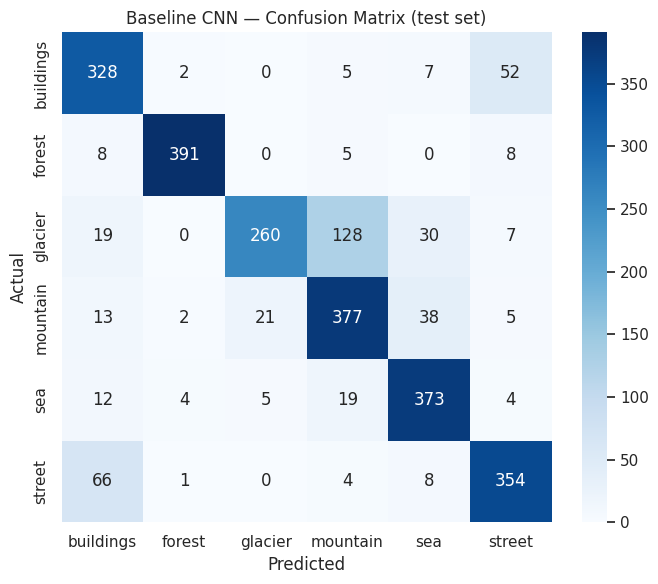

In [24]:
def evaluate_model(model, dataset, class_names, model_name="model"):
    y_true, y_pred, y_prob = [], [], []
    for images, labels in dataset:
        probs = model.predict(images, verbose=0)
        y_prob.append(probs)
        y_pred.append(np.argmax(probs, axis=1))
        y_true.append(labels.numpy())

    y_true = np.concatenate(y_true)
    y_pred = np.concatenate(y_pred)
    y_prob = np.concatenate(y_prob)

    acc = accuracy_score(y_true, y_pred)
    precision, recall, f1, support = precision_recall_fscore_support(y_true, y_pred, average="macro")

    print(f"=== {model_name} — Test set evaluation ===")
    print(f"Accuracy:            {acc:.4f}")
    print(f"Macro Precision:     {precision:.4f}")
    print(f"Macro Recall:        {recall:.4f}")
    print(f"Macro F1-score:      {f1:.4f}\n")
    print("Per-class report:")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(7, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Actual")
    ax.set_title(f"{model_name} — Confusion Matrix (test set)")
    plt.tight_layout()
    plt.show()

    return {
        "y_true": y_true, "y_pred": y_pred, "y_prob": y_prob,
        "accuracy": acc, "precision": precision, "recall": recall, "f1": f1, "confusion_matrix": cm,
    }

baseline_results = evaluate_model(baseline_model, test_ds_cached, CLASS_NAMES, model_name="Baseline CNN")

In [25]:
# Per-class accuracy (diagonal of the row-normalized confusion matrix) to identify easiest/hardest classes.
cm = baseline_results["confusion_matrix"]
per_class_acc = cm.diagonal() / cm.sum(axis=1)
per_class_acc_df = pd.Series(per_class_acc, index=CLASS_NAMES, name="per_class_accuracy").sort_values(ascending=False)
per_class_acc_df

,per_class_accuracy
forest,0.949029
sea,0.894484
buildings,0.832487
mountain,0.826754
street,0.817552
glacier,0.585586


### Class-Wise Performance Analysis

Based on the per-class results above, **`forest`** is the easiest class for the model to recognize (94.9% per-class accuracy), followed by **`sea`** (89.4%). The dense green texture of forest images is quite distinctive, so it is less likely to be confused with the other scene types.

By far the hardest class in this run is **`glacier`** (58.6% accuracy) — well below every other class. The model most often mistook glacier images for `mountain`, since both classes can contain very similar combinations of snow, rock, and sky. **`street`** (81.8%), **`mountain`** (82.7%), and **`buildings`** (83.2%) sit in a fairly close mid-range; `buildings` and `street` are also harder to separate because they often appear together in the same image — for example, a street photo may also contain several building facades.

These results are consistent with the visually similar classes identified during the EDA in Section 5.

## 12. Error Analysis

I inspect concrete misclassified test images: actual class, predicted class, and the model's confidence, then
look for recurring confusion patterns using the confusion matrix.


Total misclassified test images: 473 / 2556 (18.5%)


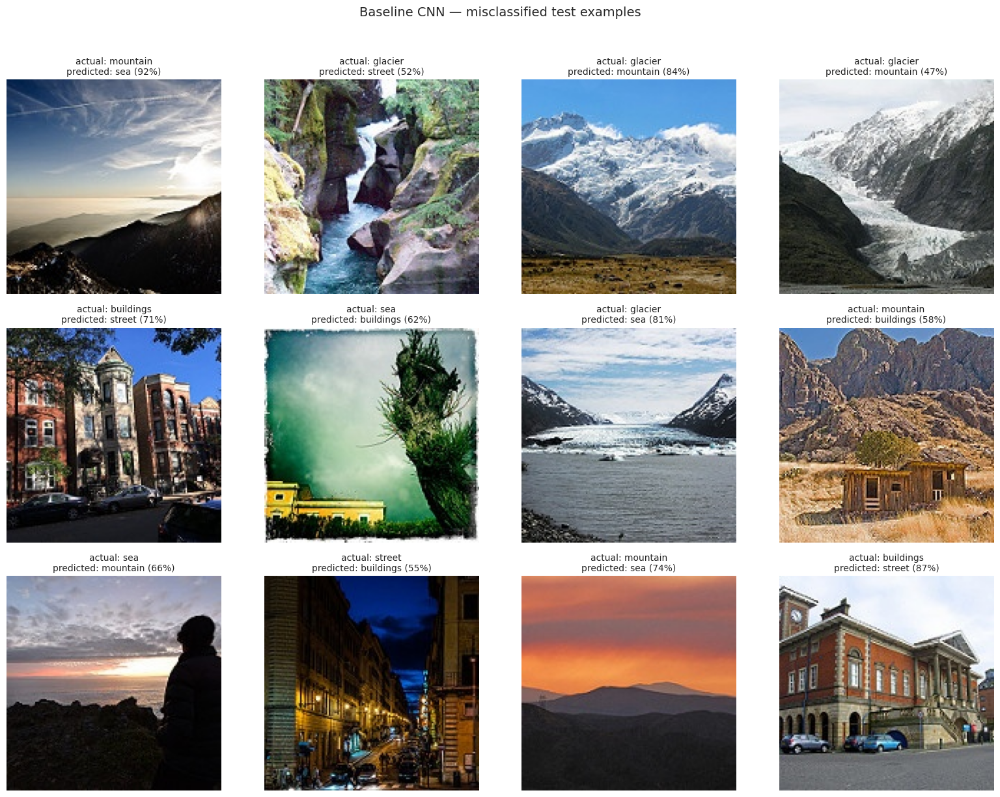

In [26]:
y_true = baseline_results["y_true"]
y_pred = baseline_results["y_pred"]
y_prob = baseline_results["y_prob"]

misclassified_idx = np.where(y_true != y_pred)[0]
print(f"Total misclassified test images: {len(misclassified_idx)} / {len(y_true)} "
      f"({len(misclassified_idx) / len(y_true):.1%})")

n_show = min(12, len(misclassified_idx))
show_idx = np.random.choice(misclassified_idx, n_show, replace=False)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for ax, idx in zip(axes.ravel(), show_idx):
    img = Image.open(test_file_paths[idx]).resize(IMG_SIZE)
    confidence = y_prob[idx][y_pred[idx]]
    ax.imshow(img)
    ax.set_title(
        f"actual: {CLASS_NAMES[y_true[idx]]}\npredicted: {CLASS_NAMES[y_pred[idx]]} ({confidence:.0%})",
        fontsize=10,
    )
    ax.axis("off")
plt.suptitle("Baseline CNN — misclassified test examples", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

In [27]:
# Recurring confusion patterns: top off-diagonal (actual, predicted) pairs.
cm = baseline_results["confusion_matrix"]
confusion_pairs = []
for i, actual_cls in enumerate(CLASS_NAMES):
    for j, pred_cls in enumerate(CLASS_NAMES):
        if i != j and cm[i, j] > 0:
            confusion_pairs.append((actual_cls, pred_cls, cm[i, j]))

confusion_df = pd.DataFrame(confusion_pairs, columns=["actual", "predicted", "count"])
confusion_df = confusion_df.sort_values("count", ascending=False).reset_index(drop=True)
confusion_df.head(10)

### Why the Model Makes Mistakes

* **`glacier` → `mountain`:** By far the single largest confusion pair in this run (**128 images**) — more than double the next-largest pair. Glacier and mountain scenes can look very similar because both may contain snow, rocks, and sky, and their colors and overall composition can be hard for the model to separate based only on visual features.

* **`buildings` ↔ `street`:** These classes often overlap in real images (`street`→`buildings`: 66 images, `buildings`→`street`: 52). A street photo can easily contain several buildings, so there may not always be a clear visual boundary between the two categories.

* **`mountain` → `sea`** (38 images) **and `glacier` → `sea`** (30 images): Coastal or lake-adjacent mountain and glacier scenes can share large areas of blue sky/water with sea photos, and both can have similar horizon-line compositions.

* **Confidence of predictions:** *(Qualitative impression from the misclassified-image grid above, not a formally computed statistic in this notebook.)* Several of the misclassified examples appear to have visibly lower softmax confidence than typical correct predictions, suggesting the model is often uncertain rather than confidently wrong on these visually similar cases — but this notebook does not compute a mean-confidence comparison between correct and incorrect predictions to confirm it numerically.

**Recurring pattern:** Most of the model's mistakes occur between classes that are visually or semantically related, with **glacier/mountain** now the dominant source of errors, followed by **buildings/street** and, to a lesser extent, **mountain/sea** and **glacier/sea** — rather than being spread randomly across all six classes. This is consistent with what was expected from the EDA in Section 5.

## 13. Transfer Learning Model

For the second model, I used **MobileNetV2** pretrained on ImageNet. I chose it because it is relatively lightweight and efficient, while its pretrained layers already capture useful visual features such as edges, textures, and shapes. This gives the model a strong starting point for classifying natural-scene images.

### Procedure

1. **Load the pretrained model**

   MobileNetV2 is loaded without its original classification layer. Its pretrained weights are initially frozen so they are not changed during the first stage of training.

2. **Add a new classification head**

   A new classification head is added on top of MobileNetV2 to predict the six scene classes.

3. **Train the classification head**

   Initially, only the new classification head is trained. The frozen MobileNetV2 base acts as a feature extractor, using the visual patterns it learned from ImageNet.

4. **Fine-tune the model**

   After training the new head, the upper layers of MobileNetV2 are unfrozen and training continues with a much smaller learning rate. This allows the pretrained features to adapt to the scene-classification task while helping preserve the useful features learned from ImageNet.

In [28]:
def build_transfer_model(input_shape=(150, 150, 3), num_classes=6, base_trainable=False):
    base_model = keras.applications.MobileNetV2(
        input_shape=input_shape, include_top=False, weights="imagenet"
    )
    base_model.trainable = base_trainable

    inputs = keras.Input(shape=input_shape)
    # MobileNetV2 expects inputs preprocessed to [-1, 1].
    x = keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs, name="mobilenetv2_transfer")
    return model, base_model


transfer_model, mobilenet_base = build_transfer_model(input_shape=IMG_SIZE + (3,), num_classes=NUM_CLASSES)

transfer_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"],
)

transfer_model.summary()

/tmp/ipykernel_2025/1004782004.py:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = keras.applications.MobileNetV2(


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "mobilenetv2_transfer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │         7,686 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,265,670 (8.64 MB)

 Trainable params: 7,686 (30.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/15
373/373 ━━━━━━━━━━━━━━━━━━━━ 118s 305ms/step - accuracy: 0.7647 - loss: 0.6520 - val_accuracy: 0.8755 - val_loss: 0.3562 - learning_rate: 0.0010
Epoch 2/15
373/373 ━━━━━━━━━━━━━━━━━━━━ 112s 301ms/step - accuracy: 0.8415 - loss: 0.4435 - val_accuracy: 0.8920 - val_loss: 0.2984 - learning_rate: 0.0010
Epoch 3/15
373/373 ━━━━━━━━━━━━━━━━━━━━ 111s 298ms/step - accuracy: 0.8478 - loss: 0.4203 - val_accuracy: 0.8736 - val_loss: 0.3405 - learning_rate: 0.0010
Epoch 4/15
373/373 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8511 - loss: 0.4039
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
373/373 ━━━━━━━━━━━━━━━━━━━━ 111s 298ms/step - accuracy: 0.8503 - loss: 0.4162 - val_accuracy: 0.8751 - val_loss: 0.3474 - learning_rate: 0.0010
Epoch 5/15
373/373 ━━━━━━━━━━━━━━━━━━━━ 111s 297ms/step - accuracy: 0.8615 - loss: 0.3824 - val_accuracy: 0.8779 - val_loss: 0.3197 - learning_rate: 5.0000e-04
Epoch 6/15
373/373 ━━━━━━━━━━━━━━━━━━━━ 113s 303ms/step - accur

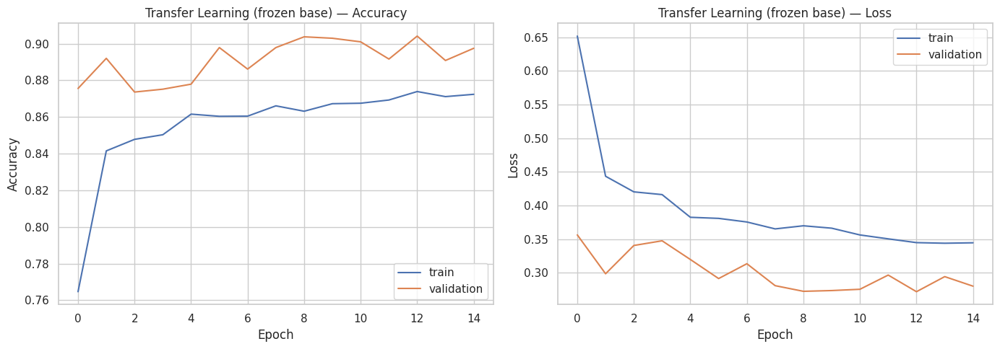

In [29]:
# MobileNetV2 handles its own preprocessing, so we pass the same raw
# [0, 255] images used by the baseline CNN. Both models also use the
# same data augmentation.
transfer_callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    keras.callbacks.ModelCheckpoint("best_transfer_head.keras", monitor="val_loss", save_best_only=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-7, verbose=1),
]

start_time = time.time()
transfer_history_head = transfer_model.fit(
    train_ds_aug,
    validation_data=val_ds_cached,
    epochs=15,
    callbacks=transfer_callbacks,
)
transfer_head_time = time.time() - start_time

_ = plot_training_curves(transfer_history_head, title_prefix="Transfer Learning (frozen base) — ")


### Fine-tuning

For fine-tuning, I chose to unfreeze only the **top ~20%** of MobileNetV2's layers while keeping the rest frozen (31 of 154 layers, ≈20.1%). The upper layers contain more task-specific, high-level features, so they can be adjusted to better fit the scene-classification problem.

I then continued training with a **100× smaller learning rate** than the initial head-training stage (`1e-5` vs. `1e-3`). This allows the model to make small adjustments to the pretrained features without changing them too much. The lower layers remain frozen and keep the more general features learned from ImageNet, such as edges, textures, and basic shapes.

I avoided unfreezing the entire network with a large learning rate because this could change the pretrained weights too much and reduce the benefit of starting from a pretrained model.

Fine-tuning the top 31 of 154 MobileNetV2 layers.
Epoch 16/25
373/373 ━━━━━━━━━━━━━━━━━━━━ 128s 318ms/step - accuracy: 0.8134 - loss: 0.4964 - val_accuracy: 0.9002 - val_loss: 0.2761 - learning_rate: 1.0000e-05
Epoch 17/25
373/373 ━━━━━━━━━━━━━━━━━━━━ 116s 310ms/step - accuracy: 0.8527 - loss: 0.4000 - val_accuracy: 0.9057 - val_loss: 0.2760 - learning_rate: 1.0000e-05
Epoch 18/25
373/373 ━━━━━━━━━━━━━━━━━━━━ 115s 308ms/step - accuracy: 0.8621 - loss: 0.3746 - val_accuracy: 0.9041 - val_loss: 0.2717 - learning_rate: 1.0000e-05
Epoch 19/25
373/373 ━━━━━━━━━━━━━━━━━━━━ 115s 309ms/step - accuracy: 0.8701 - loss: 0.3518 - val_accuracy: 0.9068 - val_loss: 0.2585 - learning_rate: 1.0000e-05
Epoch 20/25
373/373 ━━━━━━━━━━━━━━━━━━━━ 116s 310ms/step - accuracy: 0.8778 - loss: 0.3351 - val_accuracy: 0.9065 - val_loss: 0.2569 - learning_rate: 1.0000e-05
Epoch 21/25
373/373 ━━━━━━━━━━━━━━━━━━━━ 116s 311ms/step - accuracy: 0.8823 - loss: 0.3202 - val_accuracy: 0.9119 - val_loss: 0.2451 - learning_r

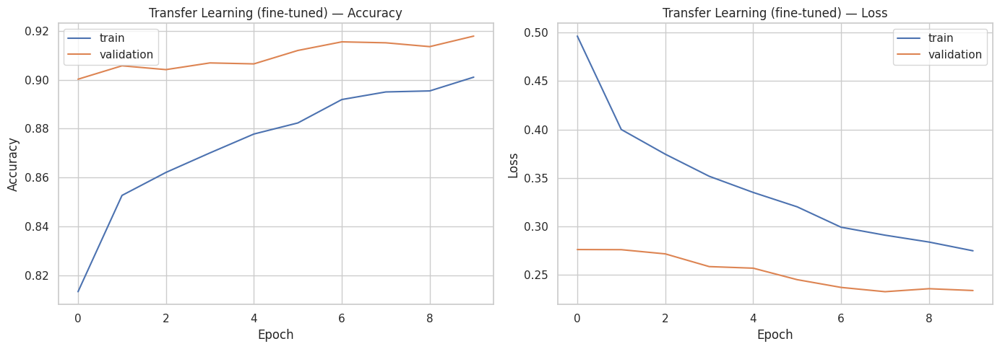

In [30]:
mobilenet_base.trainable = True

# Freeze all layers except the last ~20%.
fine_tune_at = int(len(mobilenet_base.layers) * 0.8)
for layer in mobilenet_base.layers[:fine_tune_at]:
    layer.trainable = False

print(f"Fine-tuning the top {len(mobilenet_base.layers) - fine_tune_at} of "
    f"{len(mobilenet_base.layers)} MobileNetV2 layers.")

transfer_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),  # much smaller LR for fine-tuning
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"],
)

fine_tune_callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    keras.callbacks.ModelCheckpoint("best_transfer_finetuned.keras", monitor="val_loss", save_best_only=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-8, verbose=1),
]


initial_epoch = transfer_history_head.epoch[-1] + 1

start_time = time.time()
transfer_history_finetune = transfer_model.fit(
    train_ds_aug,
    validation_data=val_ds_cached,
    epochs=initial_epoch + 10,
    initial_epoch=initial_epoch,
    callbacks=fine_tune_callbacks,
)
transfer_finetune_time = time.time() - start_time
transfer_train_time = transfer_head_time + transfer_finetune_time

_ = plot_training_curves(transfer_history_finetune, title_prefix="Transfer Learning (fine-tuned) — ")

In [31]:
transfer_results = evaluate_model(transfer_model, test_ds_cached, CLASS_NAMES, model_name="Transfer Learning (MobileNetV2, fine-tuned)")

## 14. Model Comparison


In [32]:
def count_trainable_params(model):
    return int(sum(np.prod(w.shape) for w in model.trainable_weights))

comparison_df = pd.DataFrame([
    {
        "Model": "Baseline CNN (from scratch)",
        "Input size": f"{IMG_SIZE[0]}x{IMG_SIZE[1]}x3",
        "Trainable params": f"{count_trainable_params(baseline_model):,}",
        "Val accuracy": f"{max(baseline_history.history['val_accuracy']):.4f}",
        "Test accuracy": f"{baseline_results['accuracy']:.4f}",
        "Test F1 (macro)": f"{baseline_results['f1']:.4f}",
        "Training time (s)": f"{baseline_train_time:.1f}",
    },
    {
        "Model": "MobileNetV2 Transfer Learning (fine-tuned)",
        "Input size": f"{IMG_SIZE[0]}x{IMG_SIZE[1]}x3",
        "Trainable params": f"{count_trainable_params(transfer_model):,}",
        "Val accuracy": f"{max(transfer_history_finetune.history['val_accuracy']):.4f}",
        "Test accuracy": f"{transfer_results['accuracy']:.4f}",
        "Test F1 (macro)": f"{transfer_results['f1']:.4f}",
        "Training time (s)": f"{transfer_train_time:.1f}",
    },
])
comparison_df

,Model,Input size,Trainable params,Val accuracy,Test accuracy,Test F1 (macro),Training time (s)
0,Baseline CNN (from scratch),150x150x3,"456,710",0.8294,0.8149,0.8150,1793.9
1,MobileNetV2 Transfer Learning (fine-tuned),150x150x3,"1,626,246",0.9178,0.9171,0.9185,2853.4


### Production Model Selection

Based on the comparison results, the **fine-tuned MobileNetV2** is the stronger choice for production. It achieved **91.71% test accuracy and 0.9185 macro F1**, compared with **81.49% accuracy and 0.8150 macro F1** for the baseline CNN. This represents a **10.2 percentage-point improvement in accuracy** and a **0.104 increase in macro F1**.

The main advantage of MobileNetV2 is that it starts with useful visual features learned from ImageNet, such as edges, textures, and shapes. Instead of learning these features from scratch, the model can adapt pretrained representations to the six scene categories. This is particularly useful given the relatively small size of the dataset.

MobileNetV2 is also designed to be lightweight and efficient, making it a practical architecture for deployment where computational resources may be limited, such as mobile or edge devices.

### Recommendation

The **fine-tuned MobileNetV2** (`final_scene_classifier.keras`) is the recommended production model because its substantial improvement in predictive performance outweighs its higher training cost in this experiment. It achieved a **10.2-point accuracy gain** while using **1.63M parameters**, compared with **456K trainable parameters** for the baseline CNN.

Although MobileNetV2 took longer to train in this run (**2853.4s vs. 1793.9s**), training time is generally less important than inference performance once the model is deployed. The baseline CNN also stopped after only 14 epochs due to `EarlyStopping`, so its shorter training time does not indicate better efficiency or convergence.

## 15. Prediction on New Images

A reusable function that takes the path to a brand-new image and returns the predicted class, confidence, and a displayed copy of the image. It uses the **best-performing model from the comparison above** and is tested on
images from `seg_pred/` — a folder the model has *never* seen during training, validation, or testing.

In [33]:
# Pick whichever model scored higher on the test set for the demo below.
best_model, best_model_name = (
    (transfer_model, "Transfer Learning (MobileNetV2)")
    if transfer_results["accuracy"] >= baseline_results["accuracy"]
    else (baseline_model, "Baseline CNN")
)
print(f"Using best model for predictions: {best_model_name}")


def predict_image(model, img_path, class_names=CLASS_NAMES, img_size=IMG_SIZE, display=True):
    """Predict the scene class of a single new image.

    Returns a dict with the predicted class, confidence, and full per-class probability
    breakdown. Optionally displays the image with the prediction as its title.
    """
    img = keras.utils.load_img(img_path, target_size=img_size)
    img_array = keras.utils.img_to_array(img)
    batch = tf.expand_dims(img_array, 0)

    probs = model.predict(batch, verbose=0)[0]
    pred_idx = int(np.argmax(probs))

    result = {
        "image_path": str(img_path),
        "predicted_class": class_names[pred_idx],
        "confidence": float(probs[pred_idx]),
        "all_probabilities": dict(zip(class_names, probs.tolist())),
    }

    if display:
        plt.figure(figsize=(4, 4))
        plt.imshow(img)
        plt.title(f"{result['predicted_class']} ({result['confidence']:.1%})")
        plt.axis("off")
        plt.show()

    return result

Using best model for predictions: Transfer Learning (MobileNetV2)


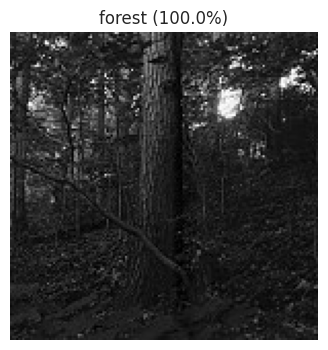

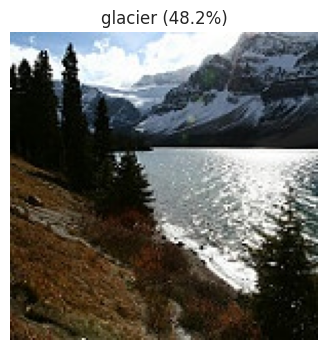

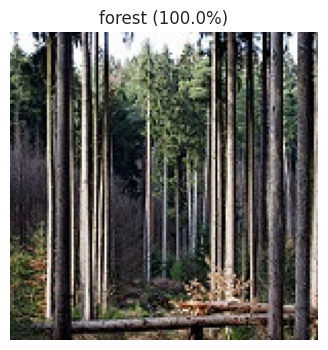

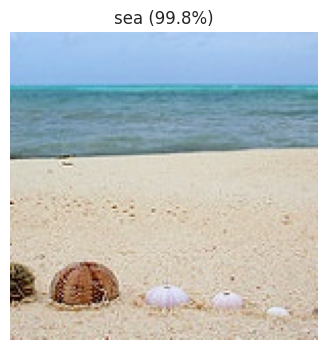

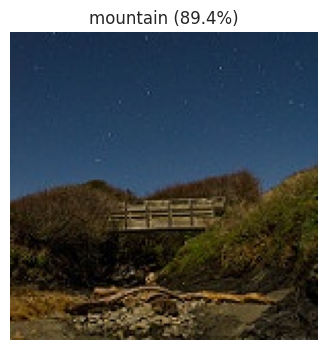

,image_path,predicted_class,confidence
0,dataset/seg_pred/seg_pred/13936.jpg,forest,0.999952
1,dataset/seg_pred/seg_pred/22524.jpg,glacier,0.482376
2,dataset/seg_pred/seg_pred/21528.jpg,forest,0.999901
3,dataset/seg_pred/seg_pred/15766.jpg,sea,0.998447
4,dataset/seg_pred/seg_pred/17899.jpg,mountain,0.893958


In [34]:
# Test on at least 5 completely external images from seg_pred/ (never used in training).
pred_pool = list(PRED_DIR.glob("*.jpg"))
demo_images = random.sample(pred_pool, min(5, len(pred_pool)))

demo_results = [predict_image(best_model, img_path) for img_path in demo_images]
pd.DataFrame(demo_results)[["image_path", "predicted_class", "confidence"]]

## Bonus — Grad-CAM Explainability

Grad-CAM highlights which regions of the image most influenced the model's prediction, using gradients of the
predicted class score with respect to the last convolutional feature map.


In [35]:
def make_gradcam_heatmap(img_array, model, base_model, pred_index=None):


  """Grad-CAM for a Functional model with MobileNetV2 used as a nested base model.

  Instead of creating a second model to access the intermediate convolutional
  features, we use GradientTape and run the forward pass manually. This avoids
  a Keras 3 graph-related KeyError that can occur when trying to combine the
  nested model's intermediate output with the outer model's final prediction.

  The convolutional feature map is obtained from the base model first, then
  passed through the remaining layers (GlobalAveragePooling2D, Dropout, and
  Dense) to get the final prediction.
  """



  base_layer_index = model.layers.index(base_model)
  head_layers = model.layers[base_layer_index + 1:]
  # Replicate the preprocessing step that precedes base_model inside `model`.
  preprocessed = keras.applications.mobilenet_v2.preprocess_input(img_array)
  with tf.GradientTape() as tape:
      conv_outputs = base_model(preprocessed, training=False)
      tape.watch(conv_outputs)
      x = conv_outputs
      for layer in head_layers:
          x = layer(x, training=False)
      predictions = x
      if pred_index is None:
          pred_index = tf.argmax(predictions[0])
      class_channel = predictions[:, pred_index]
  grads = tape.gradient(class_channel, conv_outputs)
  pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
  conv_outputs = conv_outputs[0]
  heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
  heatmap = tf.squeeze(heatmap)
  heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
  return heatmap.numpy()


def show_gradcam(model, base_model, img_path, img_size=IMG_SIZE, alpha=0.4):
    img = keras.utils.load_img(img_path, target_size=img_size)
    img_array = tf.expand_dims(keras.utils.img_to_array(img), 0)

    heatmap = make_gradcam_heatmap(img_array, model, base_model)
    heatmap_resized = np.uint8(255 * heatmap)
    heatmap_resized = np.array(Image.fromarray(heatmap_resized).resize(img_size))

    cmap = plt.get_cmap("jet")
    heatmap_colored = cmap(heatmap_resized / 255.0)[..., :3] * 255

    superimposed = heatmap_colored * alpha + np.array(img) * (1 - alpha)
    superimposed = np.uint8(superimposed)

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(img)
    axes[0].set_title("Original")
    axes[0].axis("off")
    axes[1].imshow(superimposed)
    axes[1].set_title("Grad-CAM")
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()


for img_path in demo_images[:3]:
    show_gradcam(transfer_model, mobilenet_base, img_path)

## Bonus — Save & Export the Final Model

In [36]:
FINAL_MODEL_PATH = "final_scene_classifier.keras"
best_model.save(FINAL_MODEL_PATH)
print(f"Saved final production model to: {FINAL_MODEL_PATH}")

Saved final production model to: final_scene_classifier.keras


## 16. Final Conclusion

### What is the computer vision problem being solved?

The goal of this project is to classify natural-scene images into one of six categories: **buildings, forest, glacier, mountain, sea, and street**. This is an image-classification problem with practical applications such as automatic photo organization, travel and mapping platforms, and processing large collections of uploaded images.

### Why is this a multi-class classification problem?

Each image belongs to **one of six classes**, so this is a multi-class classification problem. The model uses a softmax output layer to produce a probability for each class, and the class with the highest probability is selected as the final prediction.

This is different from binary classification, which has only two possible classes, and multi-label classification, where one image can have multiple labels at the same time.

### What did you discover during image EDA?

The six classes are reasonably balanced, and most images are **150×150 RGB images**. I also found noticeable differences in pixel distributions between the classes. For example, sea and glacier images tend to contain more bright blue and white tones, while forest images tend to be darker and greener.

Some classes are also naturally harder to distinguish. **Glacier and mountain** images often contain similar combinations of snow, rocks, and sky. Similarly, **buildings and street** images can overlap because buildings are often visible in street scenes. These observations were later reflected in the model's confusion matrix and error analysis.

### Why did you choose your preprocessing and augmentation techniques?

I kept the preprocessing simple and consistent across the models. Images are resized to **150×150**, loaded as RGB, and normalized before being passed to the model. The class labels are automatically created from the folder structure using `image_dataset_from_directory`.

For augmentation, I used realistic transformations such as horizontal flipping, small rotations, zooming, translation, and mild brightness/contrast changes. These transformations help the model handle differences in viewpoint, framing, and lighting.

I avoided transformations such as vertical flipping or strong color changes because they could produce unrealistic images or remove useful visual information that helps distinguish between the scene classes.

### Why did you choose this CNN architecture?

For the baseline, I built a CNN from scratch using four convolutional blocks with increasing numbers of filters (**32 → 64 → 128 → 256**). This allows the network to start by learning simple features such as edges and textures and gradually move toward more complex patterns.

I used Batch Normalization to make training more stable and Dropout to help reduce overfitting. I also chose `GlobalAveragePooling2D` instead of `Flatten` to keep the number of trainable parameters smaller.

### Is the baseline CNN overfitting?

I used the training and validation curves to check for signs of overfitting. A large gap between training and validation performance, especially when validation loss increases while training loss continues to decrease, would be a typical sign of overfitting.

**In this run, the baseline CNN showed no real sign of overfitting.** `EarlyStopping` (patience of 6, monitoring validation loss) stopped training after **14 epochs**, well short of the full 30-epoch budget. Validation loss reached its lowest value of **0.483 at epoch 8**, and `restore_best_weights=True` restored those weights.

At that point, the training accuracy was **0.808** compared with a validation accuracy of **0.829** — validation performance was slightly *higher* than training, which rules out overfitting and instead reflects normal run-to-run variation between the two splits. The final test accuracy was **81.49%**.

### Which classes are most frequently confused?

The main confusion occurred between visually similar classes. In the baseline CNN's test predictions, the largest confusion pairs were:

* `glacier` → `mountain`: **128 images** (by far the largest single pair)
* `street` → `buildings`: **66 images**
* `buildings` → `street`: **52 images**
* `mountain` → `sea`: **38 images**

There were **473 total misclassifications** out of 2,556 test images, which is about **18.5%** of the test set. These errors make sense given the visual similarities between some of the classes, and the glacier/mountain pair alone accounts for over a quarter of all errors.

### Did transfer learning improve the results?

**Yes, substantially.** Fine-tuned MobileNetV2 increased test accuracy from **81.49% to 91.71%**, an improvement of about **10.2 percentage points**. The macro F1-score also increased from **0.8150 to 0.9185**.

This shows that the ImageNet-pretrained features provided a meaningfully stronger starting point than training the CNN completely from scratch on this dataset, especially on the classes (like `glacier`) where the baseline struggled most.

### What is the final model's test accuracy and F1-score?

The final model, the fine-tuned MobileNetV2 saved as `final_scene_classifier.keras`, achieved:

* **Test Accuracy:** 91.71%
* **Macro F1-score:** 0.9185

These results were obtained on the **2,556-image test set**, which was kept untouched until the final evaluation.

### What would you improve with more time or data?

There are several ways I could improve the project further:

* Try a larger input size, such as **224×224**, and compare other pretrained architectures such as EfficientNetB0 or ResNet50.
* Experiment with **test-time augmentation** or model ensembling to improve robustness.
* Collect more examples of difficult class pairs, especially **glacier/mountain** and **buildings/street**, which were responsible for many of the baseline errors.
* Experiment with stronger augmentation techniques such as **CutMix** or **MixUp**, as well as label smoothing.
* Add a human-review step for predictions where the model has very low confidence.
* Deploy the final model through the **Streamlit app** and use **Grad-CAM** to better understand which parts of an image influenced the prediction.
* Monitor the model after deployment to see how its accuracy and confidence behave on real-world images.